In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

## Import Files

In [3]:
# Import NBA salaries table
nba_salary = pd.read_csv('nba_salary2.csv')
nba_salary.head()

,Player,2021-22,2020-21,2019-20,2018-19,2017-18,2016-17,2015-16,2014-15,2013-14,...,2005-06,2004-05,2003-04,2002-03,2001-02,2000-01,1999-00,1998-99,1997-98,1996-97
0,Stephen Curry,45780966.0,45325029.0,42674629.0,40386520.0,38468739.0,13654081.0,12945956.0,12116632.0,11504868.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,James Harden,44310840.0,43479158.0,40518442.0,32960751.0,31388759.0,29918259.0,17896589.0,16750126.0,15904415.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,John Wall,44310840.0,43479158.0,40518442.0,20668989.0,20035826.0,17761997.0,16769198.0,15618561.0,8680071.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Russell Westbrook,44211146.0,43588654.0,40844595.0,38454209.0,31388759.0,29918259.0,19063757.0,17918740.0,17097246.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Kevin Durant,42018900.0,42271404.0,39457722.0,32346173.0,27729174.0,29918259.0,25015562.0,22795904.0,21843723.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Import NBA stats table
nba_stats = pd.read_csv('nba_stats.csv')
nba_stats.head()

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON
0,Trae Young,23,76,40,36,2652,2155,711,1544,46.0,...,284,737,303,72,7,128,42,0,159,2021-22
1,DeMar DeRozan,32,76,43,33,2743,2118,774,1535,50.4,...,392,374,181,68,24,178,6,0,77,2021-22
2,Joel Embiid,28,68,45,23,2296,2079,666,1334,49.9,...,796,284,214,77,99,181,46,2,368,2021-22
3,Jayson Tatum,24,76,49,27,2731,2046,708,1564,45.3,...,609,334,217,75,49,174,22,0,667,2021-22
4,Nikola Jokic,27,74,46,28,2476,2004,764,1311,58.3,...,1019,584,281,109,63,191,66,19,444,2021-22


In [5]:
curry2 = nba_stats[nba_stats['PLAYER'] == 'Stephen Curry']
curry2

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON
13,Stephen Curry,34,64,45,19,2211,1630,535,1224,43.7,...,335,404,206,85,23,130,12,2,509,2021-22
605,Stephen Curry,33,63,37,26,2152,2015,658,1365,48.2,...,345,363,213,77,8,119,8,0,244,2020-21
1529,Stephen Curry,32,5,1,4,139,104,33,82,40.2,...,26,33,16,5,2,11,1,0,-45,2019-20
1681,Stephen Curry,31,69,52,17,2331,1881,632,1340,47.2,...,369,361,192,92,25,166,3,0,689,2018-19
2233,Stephen Curry,30,51,41,10,1631,1346,428,864,49.5,...,261,310,153,80,8,114,5,0,486,2017-18
2751,Stephen Curry,29,79,65,14,2639,1999,675,1443,46.8,...,353,524,239,142,17,183,9,0,1015,2016-17
3231,Stephen Curry,28,79,71,8,2700,2375,805,1598,50.4,...,430,527,262,169,15,161,15,2,1022,2015-16
3707,Stephen Curry,27,80,67,13,2613,1900,653,1341,48.7,...,341,619,249,163,16,158,23,0,919,2014-15
4203,Stephen Curry,26,78,50,28,2846,1873,652,1383,47.1,...,334,666,294,128,14,194,28,4,574,2013-14
4686,Stephen Curry,25,78,45,33,2983,1786,626,1388,45.1,...,314,539,240,126,12,198,15,0,133,2012-13


**We see that all of the salaries throughout the years for one player is given in a SINGLE row of data for nba_salary,  whereas one player will have one row for each year of stats for nba_stats, i.e. multiple rows for one player.**

**Therefore, before we can merge, we would need to re-format nba_salary**

## Clean and Prep Data

In [6]:
# Re-format nba_salary so that each season salary is one row of data for each player
nba_salary2 = nba_salary.melt(id_vars=['Player'],
                      var_name='SEASON',
                      value_name='SALARY')
nba_salary2

,Player,SEASON,SALARY
0,Stephen Curry,2021-22,45780966.0
1,James Harden,2021-22,44310840.0
2,John Wall,2021-22,44310840.0
3,Russell Westbrook,2021-22,44211146.0
4,Kevin Durant,2021-22,42018900.0
...,...,...,...
64761,Brett Szabo,1996-97,381449.0
64762,Earl Cureton,1996-97,355788.0
64763,Kenny Smith,1996-97,329606.0
64764,Lloyd Daniels,1996-97,319203.0


In [8]:
# Check to see that each year/season corresponds to one row of data
curry3 = nba_salary2[nba_salary2['Player'] == 'Stephen Curry']
curry3

,Player,SEASON,SALARY
0,Stephen Curry,2021-22,45780966.0
2491,Stephen Curry,2020-21,45325029.0
4982,Stephen Curry,2019-20,42674629.0
7473,Stephen Curry,2018-19,40386520.0
9964,Stephen Curry,2017-18,38468739.0
12455,Stephen Curry,2016-17,13654081.0
14946,Stephen Curry,2015-16,12945956.0
17437,Stephen Curry,2014-15,12116632.0
19928,Stephen Curry,2013-14,11504868.0
22419,Stephen Curry,2012-13,4687047.0


**Note that players will only have salary values in the years that they played**

In [9]:
# Some player names have been changed, let's update our table

nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Enes Freedom", "Enes Kanter")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Jr.", "Jr")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Dennis Schroder", "Dennis Schroeder")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Wendell Carter Jr", "Wendell Carter")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Devonte' Graham", "Devonte Graham")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Patty Mills", "Patrick Mills")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Jre Holiday", "Jrue Holiday")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Jr Holiday", "Jrue Holiday")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("JrHoliday", "Jrue Holiday")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Lonnie Walker IV", "Lonnie Walker")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Kenyon Martin Jr", "Kenyon Martin")
nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("P.J. Washington", "PJ Washington")


C:\Users\sandr\AppData\Local\Temp/ipykernel_16428/918011117.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("Jr.", "Jr")
C:\Users\sandr\AppData\Local\Temp/ipykernel_16428/918011117.py:14: FutureWarning: The default value of regex will change from True to False in a future version.
  nba_stats['PLAYER'] = nba_stats['PLAYER'].str.replace("P.J. Washington", "PJ Washington")


**Of course, there are probably many more that need name modifications, but it'll be too tedious to correct them all.  Let's move on**

## Merge the files

In [11]:
# merge the files, do an inner join to only join matching players on both tables
nba = pd.merge(nba_stats, nba_salary2.set_index('Player'), how='inner', left_on=['PLAYER', 'SEASON'], right_on=['Player', 'SEASON'])
nba.head()

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
0,Trae Young,23,76,40,36,2652,2155,711,1544,46.0,...,737,303,72,7,128,42,0,159,2021-22,8326471.0
1,DeMar DeRozan,32,76,43,33,2743,2118,774,1535,50.4,...,374,181,68,24,178,6,0,77,2021-22,26000000.0
2,Joel Embiid,28,68,45,23,2296,2079,666,1334,49.9,...,284,214,77,99,181,46,2,368,2021-22,31579390.0
3,Jayson Tatum,24,76,49,27,2731,2046,708,1564,45.3,...,334,217,75,49,174,22,0,667,2021-22,28103500.0
4,Nikola Jokic,27,74,46,28,2476,2004,764,1311,58.3,...,584,281,109,63,191,66,19,444,2021-22,31044906.0


## Save merged file

In [ ]:
# Save as csv file
nba.to_csv('nba_merged.csv', encoding='utf-8', index=False)

In [12]:
#Call the file
nba = pd.read_csv('nba_merged.csv', encoding='utf-8')

## More Cleaning and Prepping Data

In [13]:
# Identify rows with null values
df_null = nba[nba.isnull().any(axis=1)]
df_null

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
142,Kenyon Martin,21,79,20,59,1656,696,279,523,53.3,...,101,60,34,40,113,2,0,-238,2021-22,NaN
771,Kenyon Martin,20,45,10,35,1068,419,162,318,50.9,...,48,38,30,41,89,4,0,-283,2020-21,NaN
993,Devin Cannady,25,8,0,8,74,34,11,28,39.3,...,1,2,5,1,9,0,0,-23,2020-21,NaN
1222,Marquese Chriss,22,59,15,44,1196,548,210,385,54.5,...,114,78,39,62,122,9,0,-227,2019-20,NaN
1239,Isaiah Thomas,31,40,14,26,925,488,174,426,40.8,...,146,77,13,6,77,1,0,-201,2019-20,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11672,Tim Kempton,33,10,2,8,59,4,1,5,20.0,...,2,7,1,1,4,0,0,-12,1996-97,NaN
11673,Joe Stephens,24,2,1,1,10,3,1,5,20.0,...,0,3,3,0,3,0,0,-4,1996-97,NaN
11676,Anthony Miller,25,1,0,1,14,0,0,5,0.0,...,0,0,0,0,2,0,0,-14,1996-97,NaN
11677,Bruce Bowen,26,1,1,0,1,0,0,0,0.0,...,0,0,0,1,0,0,0,3,1996-97,NaN


In [14]:
# Inspect null values
null_x = nba[nba['PLAYER'].str.contains('Kempton', regex=False)]
null_x

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
11258,Tim Kempton,34,8,3,5,45,4,2,9,22.2,...,3,4,1,2,10,0,0,-15,1997-98,461442.0
11672,Tim Kempton,33,10,2,8,59,4,1,5,20.0,...,2,7,1,1,4,0,0,-12,1996-97,NaN


In [15]:
null_y = nba[nba['PLAYER'].str.contains('Cannady', regex=False)]
null_y

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
430,Devin Cannady,26,5,2,3,145,50,15,44,34.1,...,10,5,5,3,9,0,0,-11,2021-22,185578.0
993,Devin Cannady,25,8,0,8,74,34,11,28,39.3,...,1,2,5,1,9,0,0,-23,2020-21,NaN


In [16]:
null_z = nba[nba['PLAYER'].str.contains('Moute', regex=False)]
null_z

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
1525,Luc Mbah a Moute,33,3,1,2,25,5,2,5,40.0,...,0,1,2,0,0,0,0,-7,2019-20,NaN
1986,Luc Mbah a Moute,32,4,2,2,61,20,8,18,44.4,...,2,2,1,1,8,0,0,11,2018-19,4658388.0
2260,Luc Mbah a Moute,31,61,52,9,1564,460,166,345,48.1,...,55,68,72,25,100,0,0,303,2017-18,2348056.0
2748,Luc Mbah a Moute,30,80,49,31,1787,484,191,378,50.5,...,39,46,81,35,122,0,0,261,2016-17,2483409.0
3312,Luc Mbah a Moute,29,75,49,26,1274,231,94,207,45.4,...,30,34,44,19,100,0,0,155,2015-16,1447027.0
3604,Luc Mbah a Moute,28,67,16,51,1916,660,251,636,39.5,...,106,99,81,21,104,4,0,-365,2014-15,4995860.0
4217,Luc Mbah a Moute,27,64,31,33,1003,224,87,193,45.1,...,36,40,30,14,68,0,0,-153,2013-14,5338861.0
4616,Luc Mbah a Moute,26,58,28,30,1326,387,151,377,40.1,...,55,70,42,14,82,1,0,-85,2012-13,5676198.0
5050,Luc Mbah a Moute,25,43,20,23,1009,333,133,261,51.0,...,29,39,40,22,93,3,0,47,2011-12,6018376.0
5483,Luc Mbah a Moute,24,79,34,45,2093,529,198,428,46.3,...,68,77,72,28,180,8,0,-58,2010-11,1065006.0


**Upon inspection, the null values are again during years where a player did not play. We can then drop those rows with null values**

In [17]:
# Drop null values 
nba_2 = nba.dropna()
nba_2

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
0,Trae Young,23,76,40,36,2652,2155,711,1544,46.0,...,737,303,72,7,128,42,0,159,2021-22,8326471.0
1,DeMar DeRozan,32,76,43,33,2743,2118,774,1535,50.4,...,374,181,68,24,178,6,0,77,2021-22,26000000.0
2,Joel Embiid,28,68,45,23,2296,2079,666,1334,49.9,...,284,214,77,99,181,46,2,368,2021-22,31579390.0
3,Jayson Tatum,24,76,49,27,2731,2046,708,1564,45.3,...,334,217,75,49,174,22,0,667,2021-22,28103500.0
4,Nikola Jokic,27,74,46,28,2476,2004,764,1311,58.3,...,584,281,109,63,191,66,19,444,2021-22,31044906.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11669,Chris Jent,27,3,2,1,9,6,2,6,33.3,...,1,0,0,0,2,0,0,-7,1996-97,429130.0
11670,Jimmy King,23,2,0,2,22,6,2,6,33.3,...,2,1,3,0,2,0,0,-18,1996-97,572174.0
11671,Charles Jones,40,12,7,5,92,4,2,5,40.0,...,3,0,2,4,8,0,0,1,1996-97,429130.0
11674,Matt Fish,27,6,5,1,8,2,1,3,33.3,...,0,2,0,0,2,0,0,-4,1996-97,429130.0


In [20]:
# Check null values again - should be none!
df_null2 = nba_2[nba_2.isnull().any(axis=1)]
df_null2

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY


### Pre Modeling Feature Selection

**It is obvious that some features will cause major collinearity issues, so let's drop those.**

In [21]:
# Drop columns L (Losses), FGM (Field Goals Made), FGA (Field Goals Attempted), 3PM (3 Point Field Goals Made), 3PA (3 Point Field Goals Attempted), FTM (Free Throws Made), FTA (Free Throws Attempted), OREB (Offensive Rebounds), DREB (Defensive Rebounds)
nba_final = nba_2.drop(['L', 'FGM', 'FGA', '3PM', '3PA', 'FTM', 'FTA', 'OREB', 'DREB'], axis=1)
nba_final.head()

,PLAYER,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON,SALARY
0,Trae Young,23,76,40,2652,2155,46.0,38.2,90.4,284,737,303,72,7,128,42,0,159,2021-22,8326471.0
1,DeMar DeRozan,32,76,43,2743,2118,50.4,35.2,87.7,392,374,181,68,24,178,6,0,77,2021-22,26000000.0
2,Joel Embiid,28,68,45,2296,2079,49.9,37.1,81.4,796,284,214,77,99,181,46,2,368,2021-22,31579390.0
3,Jayson Tatum,24,76,49,2731,2046,45.3,35.3,85.3,609,334,217,75,49,174,22,0,667,2021-22,28103500.0
4,Nikola Jokic,27,74,46,2476,2004,58.3,33.7,81.0,1019,584,281,109,63,191,66,19,444,2021-22,31044906.0


In [22]:
# Re-arrange SEASON column to front for easier viewing
column = nba_final.pop('SEASON')
nba_final.insert(0, 'SEASON', column)
nba_final.head()

,SEASON,PLAYER,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SALARY
0,2021-22,Trae Young,23,76,40,2652,2155,46.0,38.2,90.4,284,737,303,72,7,128,42,0,159,8326471.0
1,2021-22,DeMar DeRozan,32,76,43,2743,2118,50.4,35.2,87.7,392,374,181,68,24,178,6,0,77,26000000.0
2,2021-22,Joel Embiid,28,68,45,2296,2079,49.9,37.1,81.4,796,284,214,77,99,181,46,2,368,31579390.0
3,2021-22,Jayson Tatum,24,76,49,2731,2046,45.3,35.3,85.3,609,334,217,75,49,174,22,0,667,28103500.0
4,2021-22,Nikola Jokic,27,74,46,2476,2004,58.3,33.7,81.0,1019,584,281,109,63,191,66,19,444,31044906.0


In [23]:
# Re-format the SEASON column so that it'll be easier to do datetime conversion
nba_final['SEASON'] = nba_final['SEASON'].str.split('-', expand=True)[0]
nba_final.head()

,SEASON,PLAYER,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SALARY
0,2021,Trae Young,23,76,40,2652,2155,46.0,38.2,90.4,284,737,303,72,7,128,42,0,159,8326471.0
1,2021,DeMar DeRozan,32,76,43,2743,2118,50.4,35.2,87.7,392,374,181,68,24,178,6,0,77,26000000.0
2,2021,Joel Embiid,28,68,45,2296,2079,49.9,37.1,81.4,796,284,214,77,99,181,46,2,368,31579390.0
3,2021,Jayson Tatum,24,76,49,2731,2046,45.3,35.3,85.3,609,334,217,75,49,174,22,0,667,28103500.0
4,2021,Nikola Jokic,27,74,46,2476,2004,58.3,33.7,81.0,1019,584,281,109,63,191,66,19,444,31044906.0


## Save cleaned merged file

In [24]:
# Save as csv file
nba_final.to_csv('nba_merged_final.csv', encoding='utf-8', index=False)

In [2]:
# Call file
nba_final = pd.read_csv('nba_merged_final.csv', encoding='utf-8')

**Ready for modeling**

In [26]:
# Explore descriptive statistics of the variables
nba_final.describe()

,SEASON,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SALARY
count,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,11397.000000,1.139700e+04
mean,2009.109152,27.109590,52.512065,26.280425,1239.659823,516.233746,43.661156,24.548346,70.340827,219.033693,113.840484,71.567693,39.419409,25.366061,108.143020,4.485391,0.127051,0.920593,5.712233e+06
std,7.551114,4.347612,24.501179,15.793985,888.280724,468.656002,9.737731,17.411954,19.207410,195.937939,132.595549,62.659748,34.485288,33.748370,72.454213,9.394725,1.044551,172.634499,6.696495e+06
min,1996.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-761.000000,7.403000e+03
25%,2003.000000,24.000000,34.000000,14.000000,424.000000,130.000000,40.000000,0.000000,65.000000,66.000000,21.000000,21.000000,11.000000,4.000000,45.000000,0.000000,0.000000,-79.000000,1.302521e+06
50%,2009.000000,26.000000,59.000000,26.000000,1171.000000,400.000000,43.800000,30.800000,75.000000,172.000000,69.000000,56.000000,32.000000,14.000000,105.000000,0.000000,0.000000,-12.000000,3.146900e+06
75%,2016.000000,30.000000,74.000000,39.000000,1941.000000,780.000000,48.100000,36.700000,81.700000,313.000000,156.000000,106.000000,59.000000,32.000000,162.000000,4.000000,0.000000,59.000000,7.557853e+06
max,2021.000000,43.000000,85.000000,73.000000,3484.000000,2832.000000,100.000000,100.000000,100.000000,1247.000000,935.000000,464.000000,225.000000,307.000000,371.000000,71.000000,42.000000,1072.000000,5.616972e+07


In [27]:
nba_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11397 entries, 0 to 11396
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEASON  11397 non-null  int64  
 1   PLAYER  11397 non-null  object 
 2   AGE     11397 non-null  int64  
 3   GP      11397 non-null  int64  
 4   W       11397 non-null  int64  
 5   MIN     11397 non-null  int64  
 6   PTS     11397 non-null  int64  
 7   FG%     11397 non-null  float64
 8   3P%     11397 non-null  float64
 9   FT%     11397 non-null  float64
 10  REB     11397 non-null  int64  
 11  AST     11397 non-null  int64  
 12  TOV     11397 non-null  int64  
 13  STL     11397 non-null  int64  
 14  BLK     11397 non-null  int64  
 15  PF      11397 non-null  int64  
 16  DD2     11397 non-null  int64  
 17  TD3     11397 non-null  int64  
 18  +/-     11397 non-null  int64  
 19  SALARY  11397 non-null  float64
dtypes: float64(4), int64(15), object(1)
memory usage: 1.7+ MB


## Visualizations

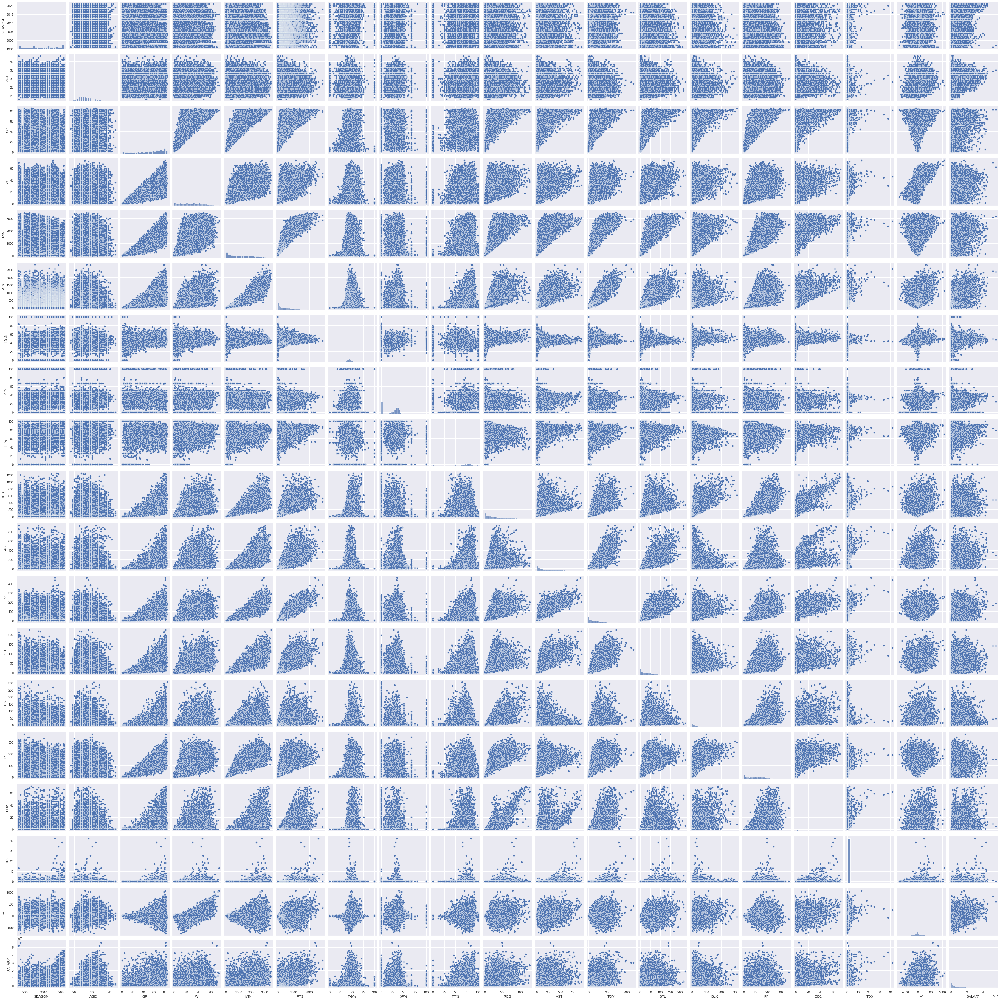

In [28]:
# View correlation among all variables using pairplot
sns.pairplot(nba_final)

<AxesSubplot:>

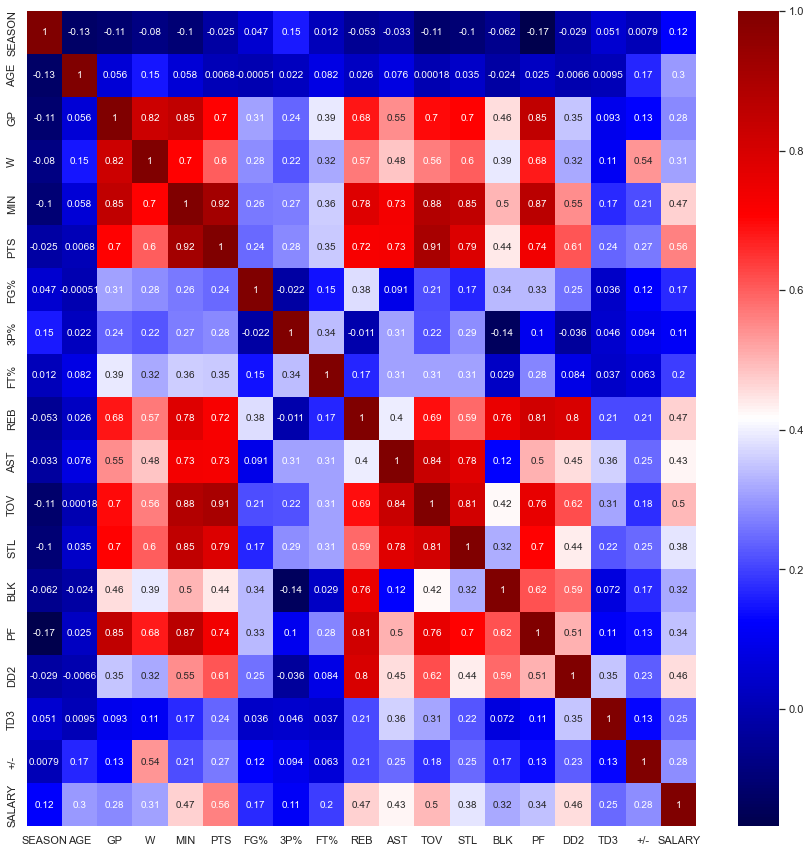

In [29]:
# View correlation among all variables using heatmap
fig, ax = plt.subplots(figsize=(15,15))


sns.heatmap(nba_final.corr(), cmap='seismic', annot=True)

<AxesSubplot:>

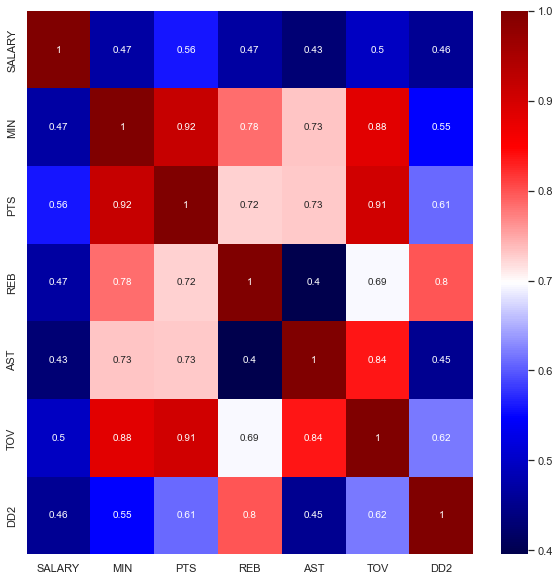

In [7]:
# Can select a few variables with high correlation for closer inspection with heatmap
subset = nba_final[['SALARY','MIN', 'PTS', 'REB', 'AST', 'TOV', 'DD2']]
fig, ax = plt.subplots(figsize=(10,10))


sns.heatmap(subset.corr(), cmap='seismic', annot=True)

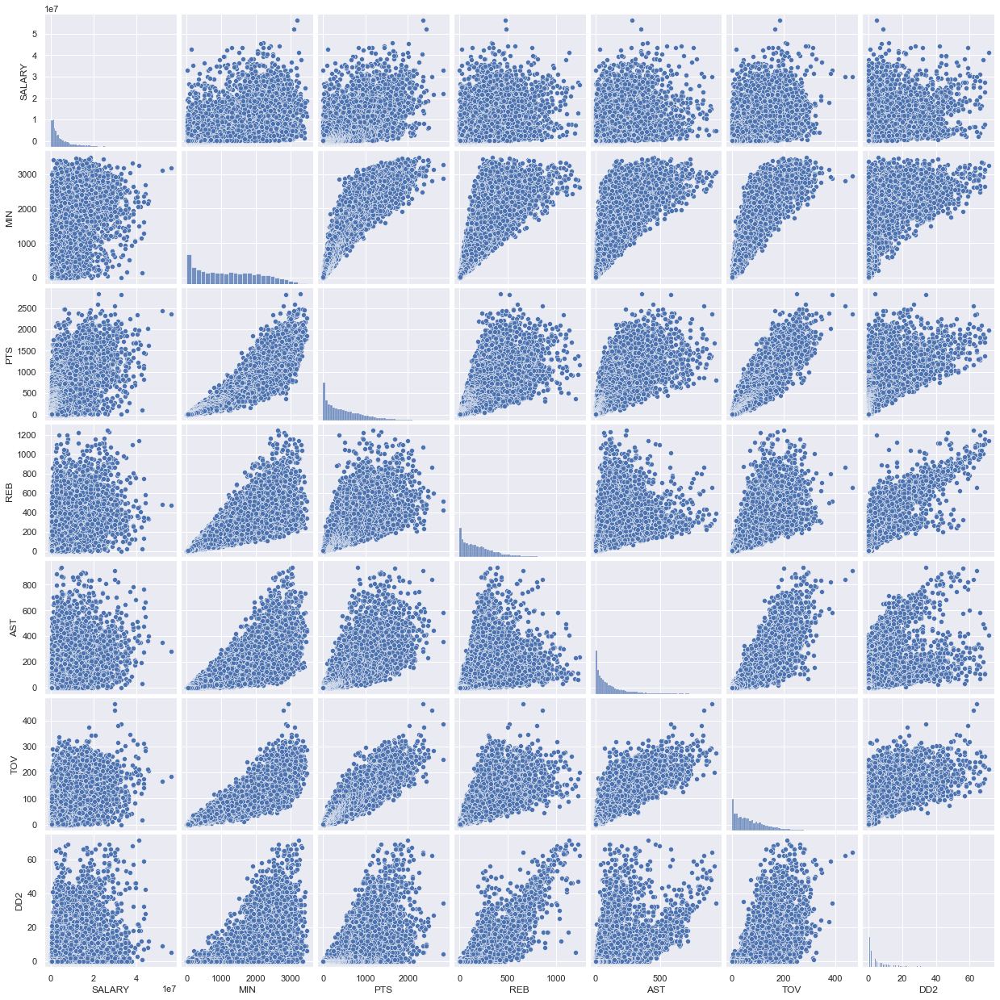

In [8]:
sns.pairplot(subset)

In [30]:
nba_final.corr()

,SEASON,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SALARY
SEASON,1.000000,-0.125847,-0.110352,-0.079558,-0.099840,-0.024913,0.047158,0.153470,0.011847,-0.053076,-0.033422,-0.113111,-0.102265,-0.062154,-0.167793,-0.028857,0.051031,0.007906,0.121272
AGE,-0.125847,1.000000,0.056444,0.150841,0.057657,0.006811,-0.000511,0.022488,0.081954,0.026141,0.075927,0.000184,0.035044,-0.023700,0.025167,-0.006585,0.009513,0.168560,0.299378
GP,-0.110352,0.056444,1.000000,0.824939,0.853988,0.704301,0.306624,0.242176,0.392047,0.681114,0.547004,0.698800,0.703588,0.455239,0.852132,0.350632,0.093163,0.125193,0.283270
W,-0.079558,0.150841,0.824939,1.000000,0.704592,0.600360,0.284153,0.223928,0.317239,0.570533,0.482326,0.562229,0.599449,0.392541,0.679714,0.315925,0.109012,0.538896,0.309027
MIN,-0.099840,0.057657,0.853988,0.704592,1.000000,0.916556,0.261708,0.268561,0.360091,0.783540,0.731085,0.883298,0.853115,0.498547,0.865220,0.548250,0.172605,0.214848,0.469605
PTS,-0.024913,0.006811,0.704301,0.600360,0.916556,1.000000,0.243464,0.281498,0.352727,0.724003,0.729821,0.905554,0.789720,0.439778,0.739925,0.609671,0.240778,0.265100,0.558674
FG%,0.047158,-0.000511,0.306624,0.284153,0.261708,0.243464,1.000000,-0.022360,0.145959,0.378335,0.091424,0.213810,0.166396,0.338265,0.334251,0.253729,0.035884,0.121242,0.170793
3P%,0.153470,0.022488,0.242176,0.223928,0.268561,0.281498,-0.022360,1.000000,0.341393,-0.010866,0.309005,0.218791,0.286713,-0.140005,0.099918,-0.036309,0.046022,0.093923,0.114501
FT%,0.011847,0.081954,0.392047,0.317239,0.360091,0.352727,0.145959,0.341393,1.000000,0.166935,0.309189,0.310506,0.307996,0.029468,0.277362,0.084199,0.036812,0.063493,0.195938
REB,-0.053076,0.026141,0.681114,0.570533,0.783540,0.724003,0.378335,-0.010866,0.166935,1.000000,0.395570,0.693754,0.587923,0.756123,0.814275,0.797990,0.207888,0.210247,0.468560


**Choose a few standout variables to see distribution plots**

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SALARY', ylabel='Density'>

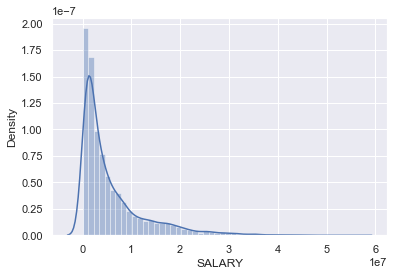

In [34]:
sns.distplot(nba_final['SALARY'])

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='DD2', ylabel='Density'>

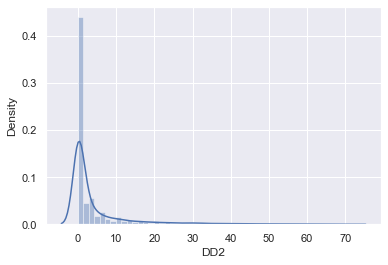

In [35]:
sns.distplot(nba_final['DD2'])

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TOV', ylabel='Density'>

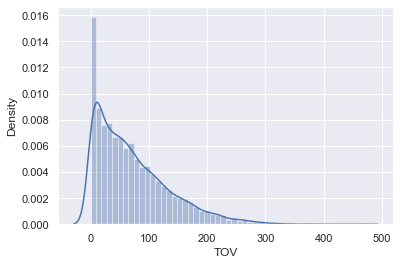

In [36]:
sns.distplot(nba_final['TOV'])

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PTS', ylabel='Density'>

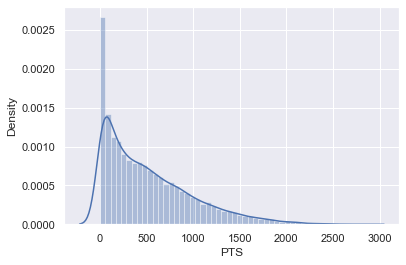

In [37]:
sns.distplot(nba_final['PTS'])

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MIN', ylabel='Density'>

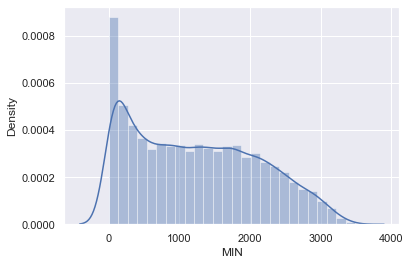

In [38]:
sns.distplot(nba_final['MIN'])

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='REB', ylabel='Density'>

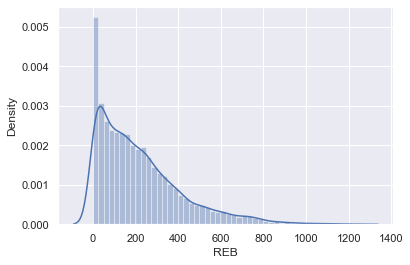

In [39]:
sns.distplot(nba_final['REB'])

**VIF**

In [40]:
# Check for multicollinearity with VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor

variables = nba_final[['AGE','GP', 'W','MIN','PTS','FG%','3P%','FT%','REB','AST','TOV','STL','BLK','PF',
                        'DD2','TD3','+/-']]
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif['features'] = variables.columns

In [41]:
vif

,VIF,features
0,19.574499,AGE
1,75.084942,GP
2,32.567624,W
3,79.852714,MIN
4,27.665100,PTS
5,20.101809,FG%
6,4.095747,3P%
7,18.262718,FT%
8,32.992863,REB
9,14.192993,AST


**Generally, a VIF value between 1-5 is considered good.  Here we have most features much higher than a value of 5.**

## Use OLS Model

In [42]:
# Build an OLS model
import statsmodels.api as sm

y = nba_final['SALARY']
X = nba_final.drop(columns=['SALARY', 'PLAYER', 'SEASON'])
X = sm.add_constant(X)

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 SALARY   R-squared:                       0.491
Model:                            OLS   Adj. R-squared:                  0.490
Method:                 Least Squares   F-statistic:                     644.4
Date:                Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                        12:31:21   Log-Likelihood:            -1.9146e+05
No. Observations:               11397   AIC:                         3.829e+05
Df Residuals:                   11379   BIC:                         3.831e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9.614e+06   3.84e+05    -25.057      0.000   -1.04e+07   -8.86e+06
AGE         4.449e+05   1.08e+04     41.299      0.000    4.24e+05    4.66e+05
GP         -6.718e+04   6739.363     -9.968      0.000   -8.04e+04    -5.4e+04
W           3008.1603   8362.837      0.360      0.719   -1.34e+04    1.94e+04
MIN        -2766.1143    263.010    -10.517      0.000   -3281.659   -2250.569
PTS          1.07e+04    338.074     31.660      0.000       1e+04    1.14e+04
FG%         8263.1978   5136.032      1.609      0.108   -1804.311    1.83e+04
3P%         5238.4091   3024.323      1.732      0.083    -689.786    1.12e+04
FT%         1.824e+04   2712.227      6.725      0.000    1.29e+04    2.36e+04
REB         1.807e+04    879.204     20.556      0.000    1.63e+04    1.98e+04
AST         1.558e+04    972.425     16.027      0.000    1.37e+04    1.75e+04
TOV        -1.056e+04   2602.041     -4.057      0.000   -1.57e+04   -5455.615
STL        -2.071e+04   2838.057     -7.296      0.000   -2.63e+04   -1.51e+04
BLK         2.103e+04   2197.804      9.569      0.000    1.67e+04    2.53e+04
PF         -1.162e+04   1742.459     -6.670      0.000    -1.5e+04   -8206.976
DD2         -1.41e+05   1.16e+04    -12.148      0.000   -1.64e+05   -1.18e+05
TD3         3.181e+05   4.96e+04      6.410      0.000    2.21e+05    4.15e+05
+/-         1205.0993    464.520      2.594      0.009     294.560    2115.638
==============================================================================
Omnibus:                     3129.401   Durbin-Watson:                   1.830
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12980.891
Skew:                           1.301   Prob(JB):                         0.00
Kurtosis:                       7.535   Cond. No.                     1.46e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.46e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [45]:
r_squared = fit.rsquared
r_squared_adj = fit.rsquared_adj

print('r_sq =', np.round(r_squared, 3))
print('r_sq_adj=', np.round(r_squared_adj,3))

r_sq = 0.491
r_sq_adj= 0.49


In [44]:
# Remove W, FG%, and 3P% due to high p-value (>0.05)

y = nba_final['SALARY']
X = nba_final.drop(columns=['SALARY', 'PLAYER', 'SEASON', 'FG%', 'W', '3P%'])
X = sm.add_constant(X)

model2 = sm.OLS(y, X)
fit2 = model2.fit()
fit2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 SALARY   R-squared:                       0.490
Model:                            OLS   Adj. R-squared:                  0.490
Method:                 Least Squares   F-statistic:                     781.9
Date:                Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                        12:33:12   Log-Likelihood:            -1.9146e+05
No. Observations:               11397   AIC:                         3.829e+05
Df Residuals:                   11382   BIC:                         3.831e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9.274e+06   3.33e+05    -27.840      0.000   -9.93e+06   -8.62e+06
AGE         4.443e+05   1.07e+04     41.426      0.000    4.23e+05    4.65e+05
GP         -6.394e+04   4402.690    -14.523      0.000   -7.26e+04   -5.53e+04
MIN        -2782.4828    259.124    -10.738      0.000   -3290.411   -2274.555
PTS          1.08e+04    334.828     32.258      0.000    1.01e+04    1.15e+04
FT%         1.947e+04   2649.826      7.348      0.000    1.43e+04    2.47e+04
REB          1.81e+04    862.086     20.998      0.000    1.64e+04    1.98e+04
AST         1.568e+04    968.179     16.196      0.000    1.38e+04    1.76e+04
TOV        -1.107e+04   2586.660     -4.281      0.000   -1.61e+04   -6002.411
STL        -2.072e+04   2830.684     -7.321      0.000   -2.63e+04   -1.52e+04
BLK         2.097e+04   2186.575      9.589      0.000    1.67e+04    2.53e+04
PF         -1.179e+04   1728.354     -6.821      0.000   -1.52e+04   -8401.566
DD2        -1.418e+05   1.16e+04    -12.245      0.000   -1.64e+05   -1.19e+05
TD3         3.183e+05   4.96e+04      6.420      0.000    2.21e+05    4.16e+05
+/-         1373.7864    294.243      4.669      0.000     797.020    1950.553
==============================================================================
Omnibus:                     3140.350   Durbin-Watson:                   1.826
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13075.644
Skew:                           1.304   Prob(JB):                         0.00
Kurtosis:                       7.553   Cond. No.                     1.27e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.27e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [48]:
r_squared2 = fit2.rsquared
r_squared_adj2 = fit2.rsquared_adj

print('r_sq =', np.round(r_squared2, 3))
print('r_sq_adj=', np.round(r_squared_adj2,3))

r_sq = 0.49
r_sq_adj= 0.49


## Simple Linear Regression Model with Scikit-Learn

In [3]:
# Before partitioning dataset, sort data in ascending order by date
nba_sorted = nba_final.sort_values('SEASON', ascending=True)
nba_sorted.head()

,SEASON,PLAYER,AGE,GP,W,MIN,PTS,FG%,3P%,FT%,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SALARY
11396,1996,James Scott,25,8,8,32,1,0.0,0.0,50.0,6,3,2,2,0,5,0,0,-12,381449.0
11132,1996,Matt Maloney,25,82,57,2387,767,44.1,40.4,76.3,160,303,122,82,1,125,2,0,326,429130.0
11133,1996,Sam Mitchell,33,82,40,2051,766,44.6,16.0,75.9,326,79,93,51,20,232,2,0,-196,2080633.0
11134,1996,Sherman Douglas,30,79,33,2314,764,50.2,33.3,66.7,193,427,153,78,10,191,2,0,-120,6231496.0
11135,1996,Nick Anderson,29,63,39,2164,757,39.7,35.3,40.4,304,182,86,120,32,160,2,0,163,6571332.0


In [49]:
nba_sorted.dtypes

SEASON      int64
PLAYER     object
AGE         int64
GP          int64
W           int64
MIN         int64
PTS         int64
FG%       float64
3P%       float64
FT%       float64
REB         int64
AST         int64
TOV         int64
STL         int64
BLK         int64
PF          int64
DD2         int64
TD3         int64
+/-         int64
SALARY    float64
dtype: object

In [4]:
# Partition dataset into train, val, test (60, 20, 20 divide)
# IMPORTANT TO HOLD MOST RECENT DATA FOR TEST SET

# Model 1: Exclude SEASON from feature set
from sklearn.model_selection import train_test_split

y = nba_sorted['SALARY']
X = nba_sorted.drop(columns=['SALARY', 'PLAYER', 'SEASON'])

X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)

In [5]:
# Fit a simple linear model
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
model = lr.fit(X_train, y_train)

r_squared = model.score(X_train, y_train)

print('r_sq =', np.round(r_squared, 3)) # Notice this is the same r_squared value we got from the OLS model!

r_sq = 0.491


In [9]:
# Score validation set
r_squared_val = model.score(X_val, y_val)

print('r_sq_val =', np.round(r_squared_val, 3))

r_sq_val = 0.474


In [13]:
# Model 2: Include SEASON in feature set
y = nba_sorted['SALARY']
X = nba_sorted.drop(columns=['SALARY', 'PLAYER'])

X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)

In [14]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
model = lr.fit(X_train, y_train)

r_squared = model.score(X_train, y_train)

print('r_sq =', np.round(r_squared, 3))

r_sq = 0.501


In [15]:
# Score validation set
r_squared_val = model.score(X_val, y_val)

print('r_sq_val =', np.round(r_squared_val, 3))

r_sq_val = 0.488


**Gap bet train and test may indicate overfitting.  See if polynomial regression can do better. Also, we'll include SEASON in feature set.**

## Polynomial Regression

In [26]:
from sklearn.preprocessing import PolynomialFeatures

y = nba_sorted['SALARY']
X = nba_sorted.drop(columns=['SALARY', 'PLAYER'])

X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)

# Apply polynomial transformation to val set
X_val_poly = poly.transform(X_val)

# Fit a model using polynomial features
lr_poly = LinearRegression()
lr_poly.fit(X_train_poly, y_train)
lr_poly.score(X_train_poly, y_train)

0.6394621014963189

In [27]:
# Score on validation set
lr_poly.score(X_val_poly, y_val)

0.5896077016214984

**R square values did indeed improve!**

In [28]:
poly.get_feature_names()

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['1',
 'x0',
 'x1',
 'x2',
 'x3',
 'x4',
 'x5',
 'x6',
 'x7',
 'x8',
 'x9',
 'x10',
 'x11',
 'x12',
 'x13',
 'x14',
 'x15',
 'x16',
 'x17',
 'x0^2',
 'x0 x1',
 'x0 x2',
 'x0 x3',
 'x0 x4',
 'x0 x5',
 'x0 x6',
 'x0 x7',
 'x0 x8',
 'x0 x9',
 'x0 x10',
 'x0 x11',
 'x0 x12',
 'x0 x13',
 'x0 x14',
 'x0 x15',
 'x0 x16',
 'x0 x17',
 'x1^2',
 'x1 x2',
 'x1 x3',
 'x1 x4',
 'x1 x5',
 'x1 x6',
 'x1 x7',
 'x1 x8',
 'x1 x9',
 'x1 x10',
 'x1 x11',
 'x1 x12',
 'x1 x13',
 'x1 x14',
 'x1 x15',
 'x1 x16',
 'x1 x17',
 'x2^2',
 'x2 x3',
 'x2 x4',
 'x2 x5',
 'x2 x6',
 'x2 x7',
 'x2 x8',
 'x2 x9',
 'x2 x10',
 'x2 x11',
 'x2 x12',
 'x2 x13',
 'x2 x14',
 'x2 x15',
 'x2 x16',
 'x2 x17',
 'x3^2',
 'x3 x4',
 'x3 x5',
 'x3 x6',
 'x3 x7',
 'x3 x8',
 'x3 x9',
 'x3 x10',
 'x3 x11',
 'x3 x12',
 'x3 x13',
 'x3 x14',
 'x3 x15',
 'x3 x16',
 'x3 x17',
 'x4^2',
 'x4 x5',
 'x4 x6',
 'x4 x7',
 'x4 x8',
 'x4 x9',
 'x4 x10',
 'x4 x11',
 'x4 x12',
 'x4 x13',
 'x4 x14',
 'x4 x15',
 'x4 x16',
 'x4 x17',
 'x5^2',
 'x5 x6',
 'x5 x

**Try a LassoCV to get a model that minimizes errors while keeping the model as simple as possible.**

## LassoCV

**Standardize the scale for data for regularized regression**

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.model_selection import KFold, cross_val_score

In [29]:
scaler = StandardScaler()
X_train_poly_scaled = scaler.fit_transform(X_train_poly)

# Apply the same scaler to the val set
X_val_poly_scaled = scaler.transform(X_val_poly)

# Fit a LASSO model using polynomial features
lasso = LassoCV()
lasso.fit(X_train_poly_scaled, y_train)
lasso.score(X_train_poly_scaled, y_train)

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32244313192832.0, tolerance: 23749737164055.496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30898192526432.0, tolerance: 23749737164055.496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29960077098928.0, tolerance: 23749737164055.496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76630916603840.0, tolerance: 24721717489506.176
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77358714581776.0, tolerance: 24721717489506.176
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51710029151424.0, tolerance: 24721717489506.176
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn

0.6148556087234286

In [24]:
# Score on validation set
lasso.score(X_val_poly_scaled, y_val)

0.5692572808718428

In [31]:
list(zip(poly.get_feature_names(['SEASON','AGE','GP','W','MIN','PTS',
                                 'FG%','3P%','FT%','REB','AST',
                                 'TOV','STL','BLK','PF','DD2',
                                 'TD3','+/-']), lasso.coef_))

[('1', 0.0),
 ('SEASON', 445221.33763569186),
 ('AGE', 4698853.115042812),
 ('GP', 1604832.8725888552),
 ('W', 522693.4195005143),
 ('MIN', 77412.54993531297),
 ('PTS', 0.0),
 ('FG%', 0.0),
 ('3P%', -0.0),
 ('FT%', -0.0),
 ('REB', 278204.90395130654),
 ('AST', 0.0),
 ('TOV', 440662.98627408704),
 ('STL', -0.0),
 ('BLK', 0.0),
 ('PF', 0.0),
 ('DD2', 0.0),
 ('TD3', -397851.9976076157),
 ('+/-', -0.0),
 ('SEASON^2', 309099.51724197046),
 ('SEASON AGE', 1204301.8012859926),
 ('SEASON GP', 2420009.229195241),
 ('SEASON W', 0.0),
 ('SEASON MIN', 135411.0277682643),
 ('SEASON PTS', 0.0),
 ('SEASON FG%', 304872.51314244635),
 ('SEASON 3P%', -61285.48873466166),
 ('SEASON FT%', -0.0),
 ('SEASON REB', 0.0),
 ('SEASON AST', 0.0),
 ('SEASON TOV', 211007.2526931374),
 ('SEASON STL', -0.0),
 ('SEASON BLK', 0.0),
 ('SEASON PF', 0.0),
 ('SEASON DD2', 0.0),
 ('SEASON TD3', -0.0),
 ('SEASON +/-', -0.0),
 ('AGE^2', -4638339.813589348),
 ('AGE GP', -4183719.4870144073),
 ('AGE W', -461890.92017261556),
 (

## RidgeCV

In [32]:
# Fit a Ridge model using polynomial features
ridge = RidgeCV()
ridge.fit(X_train_poly_scaled, y_train)
ridge.score(X_train_poly_scaled, y_train)

0.6346664875865979

In [33]:
# Score on validation set
ridge.score(X_val_poly_scaled, y_val)

0.5879345120090025

**Slightly higher r_squared value in RidgeCV than LassoCV but slightly lower test**

## Retrain chosen model and get final score on test set.

**Chosen model: Polynomial Regression**

In [34]:
# Fit a Polynomial Regression model on full dataset
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Apply polynomial transformation to test set
X_test_poly = poly.transform(X_test)

# Fit a model using polynomial features
lr_poly = LinearRegression()
lr_poly.fit(X_poly, y)

test_score = lr_poly.score(X_test_poly, y_test)
print('Test score =', test_score)

Test score = 0.6487721719778976


## Cross-Validation

**We can try a more rigorous validation method with cross-validation and see which model it selects.**

In [40]:
# Simple Linear Regression

from sklearn.model_selection import KFold, cross_val_score

X, y = nba_final.drop(columns=['SALARY', 'PLAYER']), nba_final['SALARY']

X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=3)

# Simple Linear
lr = LinearRegression()

kf = KFold(n_splits=5,
       shuffle=True,
       random_state=3)

# See all validation scores
lr_cv = cross_val_score(lr, X_train, y_train,
                        cv=kf,
                        scoring='r2')
print('Simple Regression Scores: ', lr_cv)

# Print mean score with standard deviation
print('Simple mean cv r^2: ', np.round(np.mean(lr_cv), 3), "+-", np.round(np.std(lr_cv),3))

Simple Regression Scores:  [0.51242641 0.48903195 0.51488618 0.49646949 0.46408068]
Simple mean cv r^2:  0.495 +- 0.018


In [48]:
# Polynomial Regression
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
lm_poly = LinearRegression()


# See all validation scores
poly_cv = cross_val_score(lm_poly, X_train_poly, y_train,
                         cv=kf,
                         scoring='r2')
print('Polynomial Regression Scores: ', poly_cv)

# Print mean score with standard deviation
print('Polynomial Regression mean cv r^2: ', np.round(np.mean(poly_cv), 3), "+-", np.round(np.std(poly_cv),3))

Polynomial Regression Scores:  [0.63918582 0.59599572 0.59408418 0.58270514 0.58528233]
Polynomial Regression mean cv r^2:  0.599 +- 0.02


**Again, cv also selects polynomial regression as the favored model.**


## Plot Residuals vs Predictions

**Simple Linear Regression**

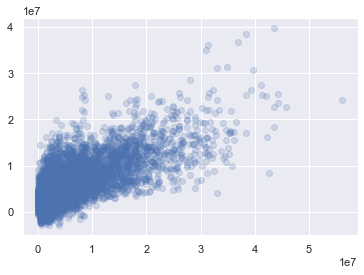

In [58]:
# Fitted vs actual
fit = lr.fit(X_train, y_train)

y_train_pred = fit.predict(X_train)

plt.scatter(y_train, y_train_pred, alpha=0.2)
plt.plot([0,200], [0,200])

### Root Mean Squared Error on Training Data

In [64]:
# Check the RMSE (root mean squared error) on the training data
from sklearn.metrics import mean_squared_error
from math import sqrt

sqrt(mean_squared_error(y_train, y_train_pred))

4684584.095364719

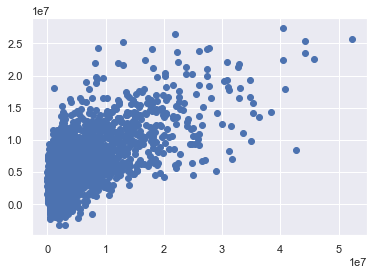

In [59]:
# Fitted vs actual
y_test_pred = fit.predict(X_test)

plt.scatter(y_test, y_test_pred)
plt.plot([0,200], [0,200])

### Root Mean Squared Error on Test Data

In [65]:
# Check the RMSE (root mean squared error) on the test data
sqrt(mean_squared_error(y_test, y_test_pred))

4722316.7420549905

Text(0.5, 1.0, 'Residuals vs Predictions')

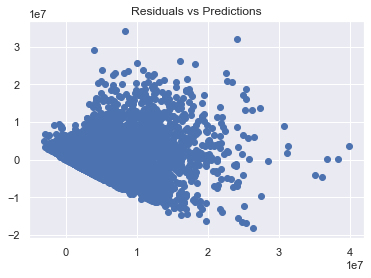

In [61]:
# Plot residuals vs predicted
simple_resid = y_train - y_train_pred

plt.scatter(y_train_pred, simple_resid)
plt.plot([0,200], [0,200])
plt.title("Residuals vs Predictions")

**Polynomial Regression**

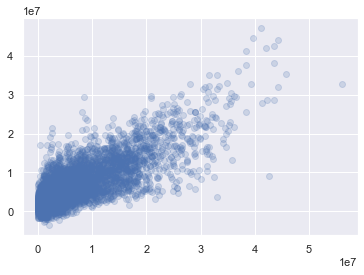

In [67]:
# Fitted vs actual
fit = lm_poly.fit(X_train_poly, y_train)

y_train_pred2 = fit.predict(X_train_poly)

plt.scatter(y_train, y_train_pred2, alpha=0.2)
plt.plot([0,200], [0,200])

### Root Mean Squared Error on Training Data

In [68]:
# Check the RMSE (root mean squared error) on the training data
sqrt(mean_squared_error(y_train, y_train_pred2))

3982728.550056375

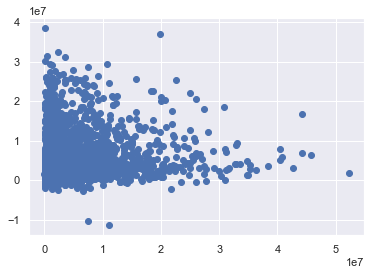

In [69]:
# Fitted vs actual
y_test_pred2 = fit.predict(X_test_poly)

plt.scatter(y_test, y_test_pred2)
plt.plot([0,200],[0,200])

### Root Mean Squared Error on Test Data

In [70]:
# Check the RMSE (root mean squared error) on the test data
sqrt(mean_squared_error(y_test, y_test_pred2))

8519192.674877467

Text(0.5, 1.0, 'Residuals vs Predictions')

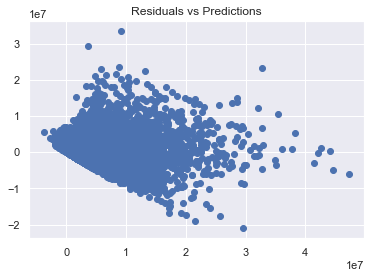

In [71]:
# Plot residuals vs predicted
poly_resid = y_train - y_train_pred2

plt.scatter(y_train_pred2, poly_resid)
plt.plot([0,200], [0,0])
plt.title("Residuals vs Predictions")
